# Exploration de la librairie GENSIM de topic modeling pour le projet fil rouge


Ce notebook a été développé sur google colab. Le fichier de données et le notebook sont à copier à la racine de votre drive google.


## Introduction

L'objectif est d'explorer ici le topic modeling via l'algorithme de LDA (Latent Dirichlet Allocation) vu en cours de machine learning.
Pour ce faire nous allons utiliser la librairie GENSIM (https://radimrehurek.com/gensim/) est une librairie de référence de "topic modelling".
Cette librairie est plus changeante que scikit-learn (https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.LatentDirichletAllocation.html, mais scikit-learn propose également une alternative par Non-Negative Matrix Factorization (NMF)).
il existe donc beaucoup d'exemples, mais ils doivent être midifiés et utilisaant la dernière version de la documentation de GENSIM (citons par exemple https://www.kaggle.com/code/yashvi/topic-modelling-using-gensim-lda/notebook).


Notons qu'il existe également des outils de deep learning pour le topic modeling, citons BERTopic (https://github.com/MaartenGr/BERTopic). Bien que globalement plus facile d'accès, nous n'utiliserons pas cette solution pour rester dans l'esprit du cours sur un algorithme dédié. Neanmoins, citons l'excellent https://www.kaggle.com/code/maartengr/topic-modeling-arxiv-abstract-with-bertopic qui montre l'évolution des topics dans le temps.

L'optimisation des hyperparamètres sera réalisé manuellement (voir https://www.baeldung.com/cs/topic-modeling-coherence-score pour une comparaison des scores de performance). Notons qu'il existe un framework dédié à cette tâche, OCTIS (pour Comparing and Optimizing Topic Models is Simple!), décrit dans https://aclanthology.org/2021.eacl-demos.31.pdf. Il n'a pas été utilisé faute de temps.


Pour la visualisation des topics il existe une librairie de référence : LDAvis (décrit dans https://nlp.stanford.edu/events/illvi2014/papers/sievert-illvi2014.pdf), que nous utiliserons. Notons qu'une alternative existe (https://github.com/x-tabdeveloping/topic-wizard), elle semble prometeuse, mais est actuellement centrée sur scikit-learn (dont l'API est stable).


## Algorithme de LDA

La LDA est accès complexe. Son fonctionnement est décrit dans le schéma qui suit. (Tiré de http://chdoig.github.io/pytexas2015-topic-modeling/#/3/4, mais le lien ne fonctionne plus.)

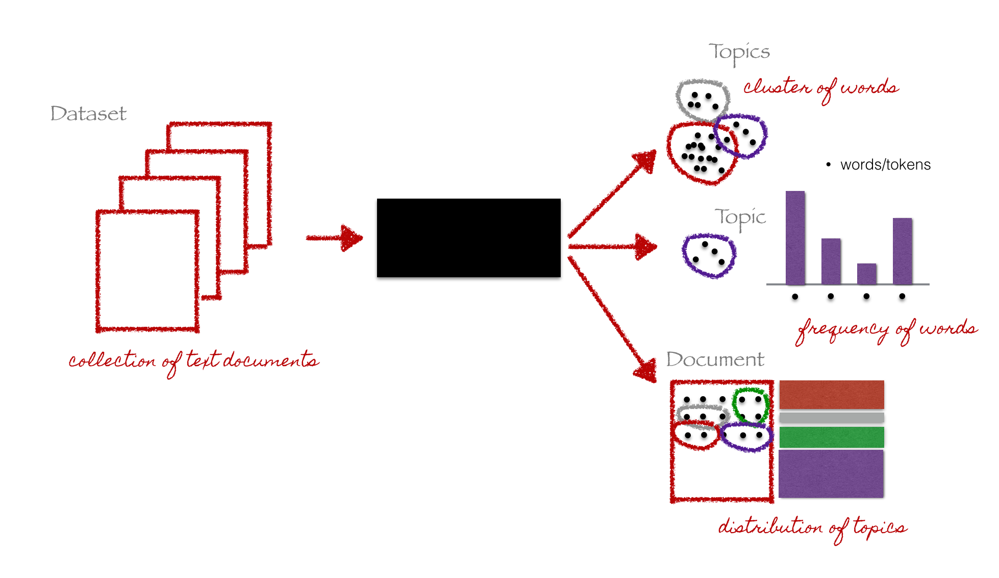


La LDA découpe un ensemble de documents en morceaux de phrases et utilise un algorithme de clustering pour identifier des topics (sujets). Une distributions de probabilité (loi de Dirichlet) est associée à chaque topic. Chaque document est ensuite associé à une distribution de sujets modélisée par une loi de Dirichlet, qui représente les proportions de chaque topic dans le document. Le choix du nombre de sujets est un hyperparamètre important qui doit être optimisé, ainsi que d'autres hyperparamètres liés à la vitesse d'apprentissage, pour obtenir de bons résultats de modélisation.

## Creation du jeu de données

### Import d'un fichier xls

Nous utiliserons pandas pour lire un fichier xlsx de données.
Il s'agit d'un tableau contenant pour un ensemble de fichier CS.AI d'arXiv :
* l'id arXiv
* les catégories de l'articles
* le titre
* les auteurs
* le résumé (toujours en anglais)
* les mots-clés extraits du pdf



Pour faciliter les traitements (temps de calcul et impact sur la RAM), nous avons supprimé les articles qui 
* ne contiennent pas que de l'anglais. (calcul par langid sur le titre) ;
* dont le premier domaine n'est pas cs.AI, pour conserver un corpus homogène. 

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
df = pd.read_excel('/content/drive/MyDrive/testGENSIM.xlsx')

In [3]:
df.head(100)

,Id,Cat,Title,Authors,Abstract,Date,Keywords
0,arXiv:2207.12229,"['cs.AI', 'cs.AR', 'cs.CY']",Towards Systems Education for Artificial Intel...,"['Jianlei Yang', 'Xiaopeng Gao', 'Weisheng Zhao']",With the rapid development of artificial intel...,"22 June, 2022",Artificial Intelligence; System Education; N...
1,arXiv:2206.14506,['cs.AI'],A calculus for epistemic interactions,"['Huili Xing', 'Zhaohui Zhu', 'Jinjin Zhang']",It plays a central role in intelligent agent s...,"29 June, 2022",process calculus; epistemic interaction; behav...
2,arXiv:2206.14081,['cs.AI'],Linear programming-based solution methods for ...,"['Can Kavaklioglu', 'Robert Helmeczi', 'Mucahi...",Constrained partially observable Markov decisi...,"28 June, 2022",Constrained POMDPs; linear programming; inte...
3,arXiv:2206.13959,['cs.AI'],Comparing and extending the use of defeasible ...,"['Lucas Rizzo', 'Luca Longo']","Dealing with uncertain, contradicting, and amb...","28 June, 2022",Defeasible Argumentation; Knowledge-based Sys...
4,arXiv:2206.13658,['cs.AI'],Geo-Situation for Modeling Causality of Geo-Ev...,"['Shirly Stephen', 'Wenwen Li', 'Torsten Hahma...",This paper proposes a framework for representi...,"27 June, 2022",geographic events; causal modeling; ontology...
...,...,...,...,...,...,...,...
95,arXiv:2011.00215,['cs.AI'],LRA: an accelerated rough set framework based ...,"['Shuyin Xia', 'Wenhua Li', 'Guoyin Wang', 'Xi...","In this paper, we propose and prove the theore...","31 October, 2020",NaN
96,arXiv:2010.16241,"['cs.AI', 'cs.LG']",Artificial Intelligence: Research Impact on Ke...,"['Andreas Christ', 'Franz Quint']",The TriRhenaTech alliance presents a collectio...,"5 October, 2020",NaN
97,arXiv:2010.16217,"['cs.AI', 'cs.LO']",Thinking About Causation: A Causal Language wi...,"['Fausto Barbero', 'Katrin Schulz', 'Sonja Sme...",This paper proposes a formal framework for mod...,"30 October, 2020",NaN
98,arXiv:2010.15875,"['cs.AI', 'cs.CL']","Retrieve, Program, Repeat: Complex Knowledge B...","['Yuncheng Hua', 'Yuan-Fang Li', 'Gholamreza H...",A compelling approach to complex question answ...,"29 October, 2020",NaN


In [4]:
df.shape

(10282, 7)

### "Amplification" du texte

Pour "amplifier" le texte en entrée, on ajoute le titre. 
Si l'abstract est toujours en anglais, ce n'est pas obligatoirement le cas pour les titres. Mais c'est bien le cas pour notre jeu de données en entrée.

In [5]:
docs =[]
for i in range(df.shape[0]):
  #print(i)
  docs.append(df['Title'].iloc[i]+ ' ' +df['Abstract'].iloc[i])
  

Le résumé (abstract) est un exercice très particulier. Pour avoir un texte plus représentatif, on va rechercher les acronymes et les remplacer par le texte d'origine. Cela permet typiquement de faire "ressortir" les noms d'algorithmes ou de méthode.

In [6]:
import re
def findAcronym(raw_text):
    return re.findall(r"\([A-Z]*\)", raw_text)

def findDef(raw_text,acronym):
    #find first occurence
    i = raw_text.find(acronym)
    if i == -1:
        return ""

    r_raw_text = raw_text[i-1::-1]
    r_raw_text = r_raw_text.split()

    acronym2 = acronym[1:-1]
    # on va faire une lecture à l'envers (le sens est donné avant l'acronyme)
    acronym2 = acronym2[::-1] 

    res = ""
    for j in range(len(acronym2)):
        #print (j," ",acronym2," ",r_raw_text[j][:40], " ",r_raw_text[j][-1] )
        if r_raw_text[j][-1].upper() == acronym2[j]:
            if len(res) == 0:
                res = r_raw_text[j].lower()
            else:
                res = res + ' ' + r_raw_text[j].lower()
        else:
            return ""

    return res[::-1]


def update_acronym(raw_text):
    acronyms = findAcronym(raw_text)
    if (len(acronyms) == 0):
        return raw_text

    result = raw_text
    for acronym in acronyms:
        meaning = findDef(raw_text,acronym)
        if len(meaning) == 0:
            continue
        
        #print("possible acronyms: ",acronym[1:-1]," :",meaning)

        result = re.sub(acronym[1:-1],meaning, result,0,re.I) # je remplace le sens par l'acronyme
    return result

In [7]:
print(docs[5430])

Fuzzy Mixed Integer Optimization Model for Regression Approach Mixed Integer Optimization has been a topic of active research in past decades. It has been used to solve Statistical problems of classification and regression involving massive data. However, there is an inherent degree of vagueness present in huge real life data. This impreciseness is handled by Fuzzy Sets. In this Paper, Fuzzy Mixed Integer Optimization Method (FMIOM) is used to find solution to Regression problem. The methodology exploits discrete character of problem. In this way large scale problems are solved within practical limits. The data points are separated into different polyhedral regions and each region has its own distinct regression coefficients. In this attempt, an attention is drawn to Statistics and Data Mining community that Integer Optimization can be significantly used to revisit different Statistical problems. Computational experimentations with generated and real data sets show that FMIOM is compar

In [8]:
print(update_acronym(docs[5430]))

Fuzzy Mixed Integer Optimization Model for Regression Approach Mixed Integer Optimization has been a topic of active research in past decades. It has been used to solve Statistical problems of classification and regression involving massive data. However, there is an inherent degree of vagueness present in huge real life data. This impreciseness is handled by Fuzzy Sets. In this Paper, Fuzzy Mixed Integer Optimization Method (fuzzy mixed integer optimization method) is used to find solution to Regression problem. The methodology exploits discrete character of problem. In this way large scale problems are solved within practical limits. The data points are separated into different polyhedral regions and each region has its own distinct regression coefficients. In this attempt, an attention is drawn to Statistics and Data Mining community that Integer Optimization can be significantly used to revisit different Statistical problems. Computational experimentations with generated and real d

On a bien remplacé (FMIOM) par Fuzzy Mixed Integer Optimization Method. Mais l'exercice a ses limites les pluriels d'acronymes, et les mots composés ne seront pas corrigés.
Nous n'avons plus besoin des majuscules et autres ponctuations. Appliquons également une correction standard au texte :

In [9]:
import string 
def clean(text):
    text = str(text).lower()
    text = re.sub(r'\[.*?\]', '', text)
    text = re.sub(r'\(.*?\)', '', text)
    text = re.sub(r"\s+", " ", text)
    text = re.sub(r'\w*\d\w*', '', text)
    text = re.sub(r"\w+…|…", "", text)  # Remove ellipsis (and last word)
    text = re.sub(f"[{re.escape(string.punctuation)}]", "", text)
    return text

In [10]:
docs2 = []
for i in docs:
  docs2.append(clean(update_acronym(i)))

docs = docs2

## Transformation pour la LDA
Le corpus sera petit, on va retirer les stopwords. (Cette manipulation serait inutile pour un grand corpus.)

In [11]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

nltk.download('wordnet')
#nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [12]:
# Tokenize the documents.
# Tokenization is the structured process of converting a sentence into an 
# individual collection of elements called tokens. It is also used to understand
# the importance of each of the words with respect to the sentence. These 
# so-called tokens can be words, numbers, or punctuation marks.

from nltk.tokenize import RegexpTokenizer

# Split the documents into tokens.
tokenizer = RegexpTokenizer(r'\w+')
for idx in range(len(docs)):
    docs[idx] = docs[idx].lower()  # Convert to lowercase.
    docs[idx] = tokenizer.tokenize(docs[idx])  # Split into words.

# Remove numbers, but not words that contain numbers.
docs = [[token for token in doc if not token.isnumeric()] for doc in docs]

# Remove words that are only one or  character.
docs = [[token for token in doc if len(token) > 1 and token not in stop_words] for doc in docs]

In [13]:
# Lemmatize the documents.
from nltk.stem.wordnet import WordNetLemmatizer

# (Stemming is the process of finding similarities between words with the same 
# root words. Stemming acts on words without knowing the context. Therefore, 
# it’s faster but doesn’t always yield the desired result.) 
# Lemmatization is the process of grouping together different infected forms of 
# a word, called lemma. The output of lemmatization is a proper word. It uses a 
# lexical vocabulary to derive the root form, is more time-consuming than 
# stemming, and is most likely to yield accurate results. It uses a lexical 
# database called WordNet.


lemmatizer = WordNetLemmatizer()
docs = [[lemmatizer.lemmatize(token) for token in doc] for doc in docs]

In [14]:
# Compute bigrams.
from gensim.models import Phrases

# Compute bigrams.
bigram = Phrases(docs, min_count=50)

# Compute trigrams.
trigram = Phrases(bigram[docs], min_count=25)

# Compute quadrigrams.
quadrigram = Phrases(trigram[bigram[docs]], min_count=15)

# Iterate through each document and add quadrigrams to it.
for idx in range(len(docs)):
    for token in quadrigram[trigram[bigram[docs[idx]]]]:
    #for token in trigram[trigram[bigram[docs[idx]]]]:

        if '_' in token:
            docs[idx].append(token)


In [15]:
# Remove rare and common tokens.
from gensim.corpora import Dictionary

# Create a dictionary representation of the documents.
dictionary = Dictionary(docs)

# Sur un grand corpus : Filter out words that occur less than 20 documents, or more than 50% of the documents.
dictionary.filter_extremes(no_below=20, no_above=0.50)

### Visualisation des n-grammes

In [16]:
for k,v in dictionary.items():
  #print(k,v)
  if '_' in v:
    print(k,v)

4 artificial_intelligence
7 bridge_gap
77 central_role
85 epistemic_logic
91 intelligent_agent
99 paper_present
138 finally_show
153 linear_programming
161 partially_observable_markov_decision_process
227 expert_system
241 knowledge_base
249 nonmonotonic_reasoning
258 previous_work
293 knowledge_graph
298 paper_proposes
303 representing_reasoning
316 compared_existing
338 multiagent_reinforcement_learning
342 paper_propose
347 reinforcement_learning
348 reinforcement_learning_agent
349 reward_function
367 bayesian_inference
376 increasing_number
378 one_hand
392 approximation_scheme
400 conditional_probability
408 hidden_markov_model
425 random_variable
457 latent_variable
464 montecarlo_tree_search
483 state_transition
491 user_interface
494 wide_range
509 different_type
530 paper_proposes_novel
564 deep_reinforcement_learning
583 policy_gradient
586 sequential_decision
611 social_medium
613 achieve_goal
616 autonomous_vehicle
637 machine_learning
639 make_decision
648 paper_examine
6

On constate que l'on a des 5-grammes (par l'agrégation de n-grammes plus petits). Rechercher explicitement les quadrigrammes n'est donc pas utile.


In [17]:
# Bag-of-words representation of the documents.
corpus = [dictionary.doc2bow(doc) for doc in docs]

In [18]:
print('Number of unique tokens: %d' % len(dictionary))
print('Number of documents: %d' % len(corpus))

Number of unique tokens: 4416
Number of documents: 10282


## Calcul d'un modèle
Le temps de calcul est trés dépendant du nombre de topics : 16 mn pour 75 topics, 51 mn pour 700.
Commencons par une valeur réduite.


In [19]:
%%time

# Train LDA model.
from gensim.models import LdaModel

# Set training parameters.
num_topics = 10 
# chunksize controls how many documents are processed at a time in the training 
# algorithm. Increasing chunksize will speed up training, at least as long as 
# the chunk of documents easily fit into memory.
chunksize = 1000  
# passes controls how often we train the model on the entire corpus. 
# Another word for passes might be “epochs”. iterations is somewhat technical, 
# but essentially it controls how often we repeat a particular loop over 
# each document. It is important to set the number of “passes” and “iterations”
# high enough.
passes = 40
iterations = 400
eval_every = None  # Don't evaluate model perplexity, takes too much time.

# Make an index to word dictionary.
temp = dictionary[0]  # This is only to "load" the dictionary.
id2word = dictionary.id2token

model = LdaModel(
    corpus=corpus,
    id2word=dictionary, #id2word,
    chunksize=chunksize,
    alpha='auto',
    eta='auto',
    iterations=iterations,
    num_topics=num_topics,
    passes=passes,
    eval_every=eval_every
)


CPU times: user 2min 45s, sys: 1.86 s, total: 2min 47s
Wall time: 2min 47s


### Visualisation manuelle des résultats

In [33]:
for i ,topic in model.show_topics(formatted=True, num_topics=15, num_words=10):
    print(str(i)+": "+ topic)

0: 0.066*"knowledge" + 0.027*"representation" + 0.018*"language" + 0.018*"base" + 0.017*"semantic" + 0.017*"graph" + 0.015*"information" + 0.014*"model" + 0.013*"knowledge_base" + 0.013*"domain"
1: 0.056*"model" + 0.045*"network" + 0.025*"inference" + 0.022*"bayesian" + 0.020*"probabilistic" + 0.015*"probability" + 0.015*"variable" + 0.015*"distribution" + 0.012*"causal" + 0.011*"conditional"
2: 0.027*"theory" + 0.023*"belief" + 0.015*"rule" + 0.012*"reasoning" + 0.012*"property" + 0.010*"paper" + 0.008*"notion" + 0.008*"probability" + 0.008*"general" + 0.008*"show"
3: 0.096*"learning" + 0.022*"network" + 0.022*"reinforcement" + 0.020*"neural" + 0.019*"task" + 0.015*"method" + 0.015*"model" + 0.014*"deep" + 0.013*"reinforcement_learning" + 0.011*"training"
4: 0.051*"agent" + 0.021*"game" + 0.018*"environment" + 0.011*"human" + 0.010*"action" + 0.010*"control" + 0.010*"behavior" + 0.009*"robot" + 0.008*"system" + 0.008*"goal"
5: 0.026*"data" + 0.019*"method" + 0.015*"based" + 0.015*"inf

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Remarque le résultat précedent est lié à une execution du calcul. Il est donc fluctuant, surtout au niveau de la numérotation des topics. Le texte qui suit est donc illustratif.

Un topic est donc une distribution de probabilité de mots. Lui associer un mot n'est donc pas simple. Dans certains cas la tâche est possible :
* 0  traite d'ontologie et de web semantique (étrangement on ne voit pas le bigramme semantic_web alors que les probabilités sont égales),
* 5 traite d'intelligence artificielle
* 8 pourrait traiter de machine learning.

Les autres sujets sont plus difficiles à trouver.
On peut néanmoins noter que l'on pourrait exclure encore des mots typiquement les verbes "neutres" : using et quelques noms communs : paper, approach, method. Ils ne portent pas en eux même de sens ici.



In [35]:
for i ,topic in model.show_topics(formatted=True, num_topics=10, num_words=10):
    print(str(i)+": "+ topic)

0: 0.066*"knowledge" + 0.027*"representation" + 0.018*"language" + 0.018*"base" + 0.017*"semantic" + 0.017*"graph" + 0.015*"information" + 0.014*"model" + 0.013*"knowledge_base" + 0.013*"domain"
1: 0.056*"model" + 0.045*"network" + 0.025*"inference" + 0.022*"bayesian" + 0.020*"probabilistic" + 0.015*"probability" + 0.015*"variable" + 0.015*"distribution" + 0.012*"causal" + 0.011*"conditional"
2: 0.027*"theory" + 0.023*"belief" + 0.015*"rule" + 0.012*"reasoning" + 0.012*"property" + 0.010*"paper" + 0.008*"notion" + 0.008*"probability" + 0.008*"general" + 0.008*"show"
3: 0.096*"learning" + 0.022*"network" + 0.022*"reinforcement" + 0.020*"neural" + 0.019*"task" + 0.015*"method" + 0.015*"model" + 0.014*"deep" + 0.013*"reinforcement_learning" + 0.011*"training"
4: 0.051*"agent" + 0.021*"game" + 0.018*"environment" + 0.011*"human" + 0.010*"action" + 0.010*"control" + 0.010*"behavior" + 0.009*"robot" + 0.008*"system" + 0.008*"goal"
5: 0.026*"data" + 0.019*"method" + 0.015*"based" + 0.015*"inf

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Visualisation graphique

In [36]:
!pip install pyLDAvis

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [37]:
# Visualize the topics
import pyLDAvis.gensim
#import pickle 
import pyLDAvis# Visualize the topics
pyLDAvis.enable_notebook()

topicData = pyLDAvis.gensim.prepare(model, corpus, dictionary, mds='mmds', sort_topics=True)  # Dimension reduction via Jensen-Shannon Divergence & mmds:Metric Multidimensional Scaling

pyLDAvis.display(topicData)  


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.9/dist-packages/pyLDAvis/_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


On a a gauche une visualisation des topics avec une analyse en composante principale. 

A droite, on peut visualiser la distribution des mots :
* Un paramètre ajustable (lambda) permet de filtrer les mots trop fréquents, ce qui permet d'observer la "saillance" des mots sur un topic ;
* on peut également sélectionner un mot et voir à gauche sont importance dans les différents topics.

Attention, on a ici trié les topics selon leur importance. 

Dans l'exemple donné (qui demeure lié à l'execution du calcul) le premier topic est en fait le "6" à l'origine. Dans la nouvelle numérotation, et en utilisant le paramètre lambda :
* 1 traite d'heuristique, d'optimisation, de recherche locale,
* 2 traite d'inférence de probabilité Bayesian.
* 3 traite d'agent, de markov, monte carlo
* 4 traite de logique floue,
* 5 traite de réseau de neurones,
* 6 traite de diagnostique médical,
* 7 traite d'ontologie,
* 8 traite de programmation logique,
* 9 traite d'IA,
* 10 traite de véhicules autonomes.


# Evaluation de la cohérence du modèle

In [38]:
from gensim.models import CoherenceModel
# Compute Perplexity
# a measure of how good the model is. lower the better.
# print('\nPerplexity: ', model.log_perplexity(corpus))  

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=model, texts=docs, dictionary=dictionary, coherence='c_v') 
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Coherence Score:  0.4770220064340469


L'usage est d'utilisé la méthode de calcul c_v pour le score de coherence, on a alors :
* .3 est mauvais
* .4 est bas
* .55 est bon
* .65 à .7 est très bon
* .8 est rare et plus de .9 est plutot synonyme d'une erreur.

Notre résultart est donc bas, mais c'est normal, il y a clairement plus de 10 topics.

## Optimisation du nombre de topics

Nous allons mesurer commment le score de cohérence change avec le nombre de topics.

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


CPU times: user 4h 48min 31s, sys: 2h 23min 5s, total: 7h 11min 36s
Wall time: 4h 57min 27s


<Axes: xlabel='number_of_topics', ylabel='coherence_score'>

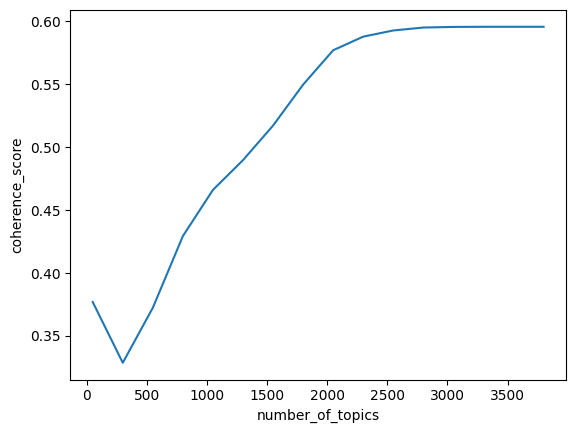

In [40]:
%%time
from gensim.models import CoherenceModel
from gensim.models import LdaModel
import seaborn as sns 
# Compute coherence score
number_of_topics = []
coherence_score = []

# Set training parameters.

# chunksize controls how many documents are processed at a time in the training 
# algorithm. Increasing chunksize will speed up training, at least as long as 
# the chunk of documents easily fit into memory.
chunksize = 1000  
# passes controls how often we train the model on the entire corpus. 
# Another word for passes might be “epochs”. iterations is somewhat technical, 
# but essentially it controls how often we repeat a particular loop over 
# each document. It is important to set the number of “passes” and “iterations”
# high enough.
passes = 20
iterations = 500
eval_every = None  # Don't evaluate model perplexity, takes too much time.

for i in range(50,4000,250):
  #lda_model = # LdaModel(corpus=corpus, id2word=id2word,iterations=50,num_topics=i)
  
  lda_model =LdaModel(
    corpus=corpus,
    id2word=dictionary,
    chunksize=chunksize,
    alpha='auto',
    eta='auto',
    iterations=iterations,
    num_topics=i,
    passes=passes,
    eval_every=eval_every)


  coherence_model_lda = CoherenceModel(model=lda_model, 
                                       texts=docs, 
                                       dictionary=dictionary, 
                                       coherence='c_v')
  
  coherence_lda = coherence_model_lda.get_coherence()
  number_of_topics.append(i)
  coherence_score.append(coherence_lda)

# Create a dataframe of coherence score by number of topics 
topic_coherence = pd.DataFrame({'number_of_topics':number_of_topics,
                                'coherence_score':coherence_score})

# Print a line plot
sns.lineplot(data=topic_coherence, x='number_of_topics', y='coherence_score')

## Modèle pour 2 100 topics

In [42]:
%%time

# Train LDA model.
from gensim.models import LdaModel

# Set training parameters.
num_topics = 2100 
# chunksize controls how many documents are processed at a time in the training 
# algorithm. Increasing chunksize will speed up training, at least as long as 
# the chunk of documents easily fit into memory.
chunksize = 2000  
# passes controls how often we train the model on the entire corpus. 
# Another word for passes might be “epochs”. iterations is somewhat technical, 
# but essentially it controls how often we repeat a particular loop over 
# each document. It is important to set the number of “passes” and “iterations”
# high enough.
passes = 40
iterations = 400
eval_every = None  # Don't evaluate model perplexity, takes too much time.

# Make an index to word dictionary.
temp = dictionary[0]  # This is only to "load" the dictionary.
id2word = dictionary.id2token

model = LdaModel(
    corpus=corpus,
    id2word=dictionary, #id2word,
    chunksize=chunksize,
    alpha='auto',
    eta='auto',
    iterations=iterations,
    num_topics=num_topics,
    passes=passes,
    eval_every=eval_every
)


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


CPU times: user 28min 31s, sys: 17min 49s, total: 46min 20s
Wall time: 29min 5s


In [49]:
topicData = pyLDAvis.gensim.prepare(model, corpus, dictionary, mds='mmds', sort_topics=True)  # Dimension reduction via Jensen-Shannon Divergence & mmds:Metric Multidimensional Scaling

pyLDAvis.display(topicData)  


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.9/dist-packages/pyLDAvis/_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


In [50]:
from gensim.models import CoherenceModel
# Compute Perplexity
# a measure of how good the model is. lower the better.
# print('\nPerplexity: ', model.log_perplexity(corpus))  

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=model, texts=docs, dictionary=dictionary, coherence='c_v') 
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Coherence Score:  0.569438991063214


Le score est maintenant bon !

## Comparaison pour quelques documents

In [43]:
#https://github.com/xiaorongw/covid19-analysis/blob/master/Topic%20modelling%20-%20Twitter.ipynb


def format_topics_sentences(ldamodel, corpus, df):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        #print("i=",i)
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                #print("j=",j)
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
                #df_new_row = pd.Series([int(topic_num), round(prop_topic,4), topic_keywords])
                #sent_topics_df = pd.concat([sent_topics_df, df_new_row], ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']
    #sent_topics_df.rename(columns={'Dominant_Topic': 'Perc_Contribution': 'Topic_Keywords']})
    # Add original text to the end of the output
    # contents = pd.Series(texts)

    sent_topics_df = pd.concat([df,sent_topics_df], axis=1)#,ignore_index=True)
    #names = list(df.columns)
    #for name in ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']:
    #  names.append( name)
    #print(names)
    #columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']
    #columns.append(df.columns)
    #sent_topics_df.columns = names
    
    #sent_topics_df.reset_index()
    return(sent_topics_df)


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [44]:
newDf = format_topics_sentences(ldamodel=model, corpus=corpus, df = df)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-43-13d748aa5220>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
<ipython-input-43-13d748aa5220>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
<ipython-input-43-13d748aa5220>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
<ipython-input-43-13d748aa5220>:20: F

In [45]:
newDf.drop(['Authors', 'Date','Cat'], axis=1)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Id,Title,Abstract,Keywords,Dominant_Topic,Perc_Contribution,Topic_Keywords
0,arXiv:2207.12229,Towards Systems Education for Artificial Intel...,With the rapid development of artificial intel...,Artificial Intelligence; System Education; N...,2037,0.2056,"intelligence, artificial, artificial_intellige..."
1,arXiv:2206.14506,A calculus for epistemic interactions,It plays a central role in intelligent agent s...,process calculus; epistemic interaction; behav...,1307,0.1212,"semantics, default, expression, epistemic, pap..."
2,arXiv:2206.14081,Linear programming-based solution methods for ...,Constrained partially observable Markov decisi...,Constrained POMDPs; linear programming; inte...,560,0.0489,"constraint, constraint_programming, show, runn..."
3,arXiv:2206.13959,Comparing and extending the use of defeasible ...,"Dealing with uncertain, contradicting, and amb...",Defeasible Argumentation; Knowledge-based Sys...,1347,0.1599,"previous, nonmonotonic, nonmonotonic_reasoning..."
4,arXiv:2206.13658,Geo-Situation for Modeling Causality of Geo-Ev...,This paper proposes a framework for representi...,geographic events; causal modeling; ontology...,1670,0.0669,"graph, knowledge_graph, edge, embeddings, trip..."
...,...,...,...,...,...,...,...
10277,arXiv:cs/9311102,Software Agents: Completing Patterns and Const...,To support the goal of allowing users to recor...,NaN,308,0.0889,"user, online, realtime, platform, stage, place..."
10278,arXiv:cs/9311101,The Difficulties of Learning Logic Programs wi...,As real logic programmers normally use cut (!)...,NaN,678,0.0793,"known, bound, ordering, lower, restricted, upp..."
10279,arXiv:cs/9309101,An Empirical Analysis of Search in GSAT,We describe an extensive study of search in GS...,NaN,477,0.0599,"theoretical, generated, finite, particularly, ..."
10280,arXiv:cs/9308102,A Market-Oriented Programming Environment and ...,Market price systems constitute a well-underst...,NaN,1376,0.0627,"resource, energy, central, allocation, thing, ..."


TODO : On pourrait regarder les documents bien marqué par le topic dominant pour recherche un nom pour chaque topic. 

## Bilan

### Généralités
Dans le notebook, l’ajout du traitement des acronymes change profondément les résultats. Sans on dispose d’un nombre optimal de topics à environ 700. Mais le score est de cohérence demeure médiocre. Comme on peut le voir dans la figure ci-après.




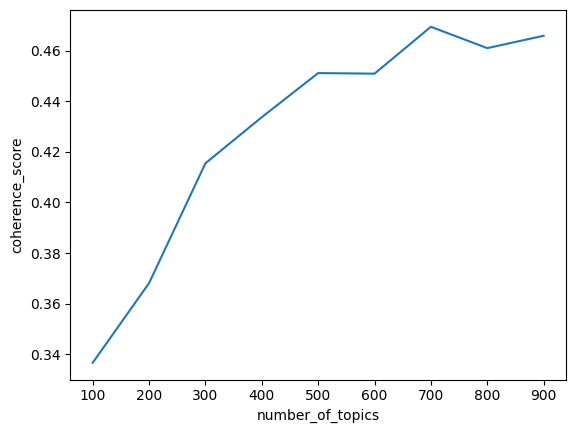

L'ajout du traitement des acronymes permet une amélioration de la cohérence, on a maintenant un plateau à 0.5694. Il était donc utile. En revanche il introduit un travail sur plus de topics.

Dans ce noteboook, la situation est biaisée car nous utilisons un texte très court (abstract et titre). Une analyse plus réaliste porterait sur l’ensemble des articles. Il y a d’ailleurs ici un paradoxe : sur l’intégralité du texte, on doit disposer d’une puissance de calcul (et de mémoire) plus grande, mais les traitements sont alors plus simple, pas besoin de retirer les stopwords, pas besoin de pré-traiter les acronymes. Nous pouvons néanmoins appréhender la complexité du topic modeling. 


### Comparaison sur un exemple industriel


Pour comparaison, sur le corpus considéré pour le projet fil rouge semantic scholar ne propose des mots-clés (calculés) que dans 45,48 % des cas. C’est peu, la tâche serait simple, tous les articles seraient traités ! Notons que c’est proche du 44,12 % estimé par échantillonnage sur l’extraction de la balise mot-clé des PDF, mais certains articles sans mots-clés (donnés par les auteurs) sont bien analysés par semantic scholar.

Faisons une comparaison pour l’article arXiv:2207.06234 (https://arxiv.org/pdf/2207.06234.pdf),
intitulé « Social Network Mining (SNM) : A Definition of Relation between The Resources and SNA ». L’auteur propose : extraction, vertex, edge, actor, multiple regression alpha-Cronbach. Semantic scholar propose : social network analysis, resultant, Information engineering, Big data, information source. Social network mining (SNM) apparaît 16 fois, ce terme est expliqué dans le titre de l’article. SNA apparaît 25 fois, mais n’est pas expliqué dans le titre. On peut considérer que social network analysis est un synonyme. (Ce qui n’est visiblement pas l’opinion de l’auteur.)
Resultant est le terme consacré pour le résultat de l’extraction d’un réseau social. 
Big data, est un terme fréquent (8 fois dans l’article). Il est donc plus caractéristique que vertex et edge, qui sont implicites dès que l’on traite d’analyse de réseau. 
Il apparaît pertinent de supprimer les acronymes (d’autant que l’on utilise des n-grammes).

L’extraction automatique apparaît donc comme une manière impartiale de décrire un document.

### Conclusion
La principale difficulté est le nommage des topics. Si on dispose d’un corpus suffisant, une part de ce nommage peut être automatisée. Mais une part importante du travail demeure humaine : a quel moment devons nous créer un nouveau topic ? Quels topics fusionner ? Doit on recalculer les topics dès qu’un topic est crée ?

Ce domaine de recherche est très actif, un algorithme semi-supervisé permettrait de simplifier les choses. On aurait alors des topics imposés (par exemple si on dispose d’un page wikipedia de taille raisonnable dessus) et des topics calculés.